# 1. Introduction to YOLO

YOLO means **You Only Look Once**. It is a deep learning model used mainly for object detection, where the model identifies objects in an image and also locates them using bounding boxes.

YOLO11 is an Ultralytics YOLO model designed for computer vision tasks such as Object detection, Instance segmentation, Image classification, Pose estimation, and Oriented object detection

In object detection, YOLO answers three important questions:

1. What object is present?
2. Where is the object located?
3. How confident is the model?

For example, in an image containing a car, motorcycle, and bus, YOLO11 can detect each object, draw a bounding box around it, and assign the correct class label.

Instead of only saying, “there is a car in this image,” YOLO can provide more useful information such as: car at this location, bus at this location, and motorcycle at this location. In this way, YOLO does not only recognize objects, but also shows where they appear in the image.

The name You Only Look Once comes from the fact that the model processes the image in a single pass and directly predicts both the object locations and their classes. Because of this one-step approach, YOLO is very fast compared with many older object detection methods. This speed makes it especially suitable for real-time detection tasks.

Saving detectiondemo.png to detectiondemo (1).png


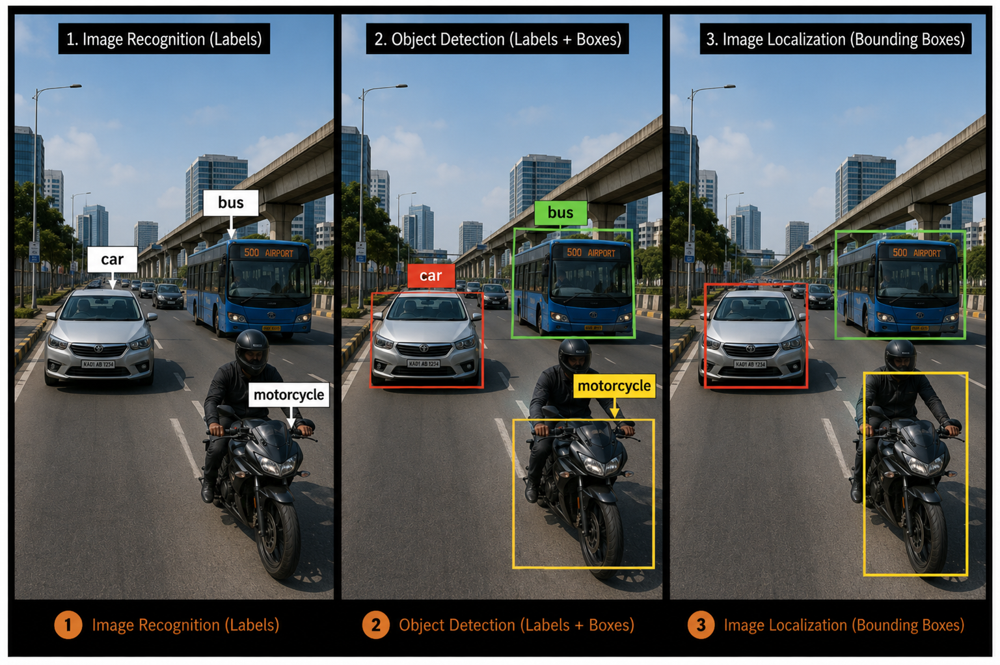

In [2]:
from google.colab import files
uploaded = files.upload()
from IPython.display import Image, display

display(Image('detectiondemo.png'))

# Object Classification and Detection

**Object Classification:** Object classification identifies the main class of an image. Example, if there is a car in image, the model only says that the image contains a car. It does not show where the car is located.


**Object Detection:** Object detection identifies and localizes objects in the image. Example, if there is car in an image, the models identifies the car and its location.

```text
Image → Car at position (x, y, w, h)
```

Object detection is more difficult than classification because it performs both as shown in the image above:

```text
Classification + Localization
```

In YOLO11, this means the model predicts:

- The object class
- Bounding box coordinates
- Confidence score

The basic idea behind YOLO is simple. The model examines the image and predicts three main things: bounding boxes, which show where objects are located; object confidence, which shows how sure the model is that an object is present; and class labels, which identify the type of object detected.

# 3. Semantic Segmentation and Instance Segmentation

**Semantic Segmentation:** Semantic segmentation assigns a class label to every pixel in an image. For example, all pixels belonging to cars are labeled as:

```text
car
```

If there are three cars, semantic segmentation treats all car pixels as one class.


**Instance Segmentation:** Instance segmentation separates individual objects of the same class. Example:

```text
Car₁, Car₂, Car₃
```

YOLO11 supports instance segmentation in addition to object detection.

Instance segmentation is useful when we want the precise shape of each object, not only its bounding box.

Saving segmentationdemo.png to segmentationdemo.png


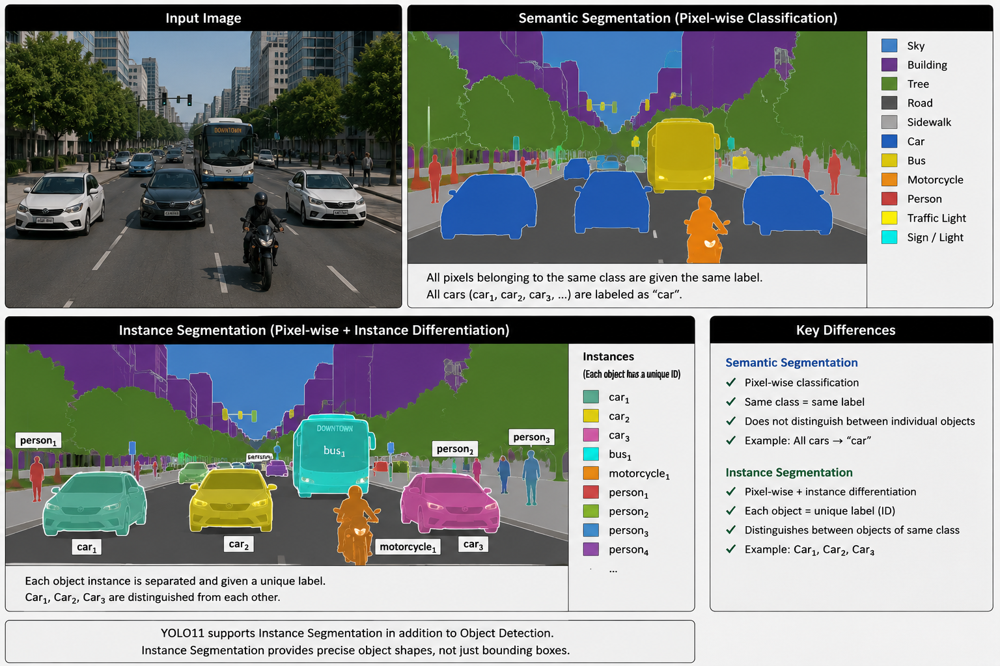

In [3]:
from google.colab import files
uploaded = files.upload()
from IPython.display import Image, display

display(Image('segmentationdemo.png'))

# Bounding Boxes in YOLO11

A bounding box is a rectangle used to show the location and size of an object in an image. A common bounding box format is:

```text
(x, y, w, h)
```

where `x` = x-coordinate of the box center,
 `y` = y-coordinate of the box center,
`w` = width of the bounding box, and
`h` = height of the bounding box. In YOLO-style annotation, the label format is:

```text
class x_center y_center w h
```

All coordinate values are usually normalized between `0` and `1`.

## Example

```text
0 0.60 0.35 0.15 0.10
```

This means:

- `0` = class ID
- `x_center` = 0.60
- `y_center` = 0.35
- `w` = 0.15
- `h` = 0.10

If class `0` represents a car, then this label describes one car in the image.

Saving bbdemo2.png to bbdemo2.png


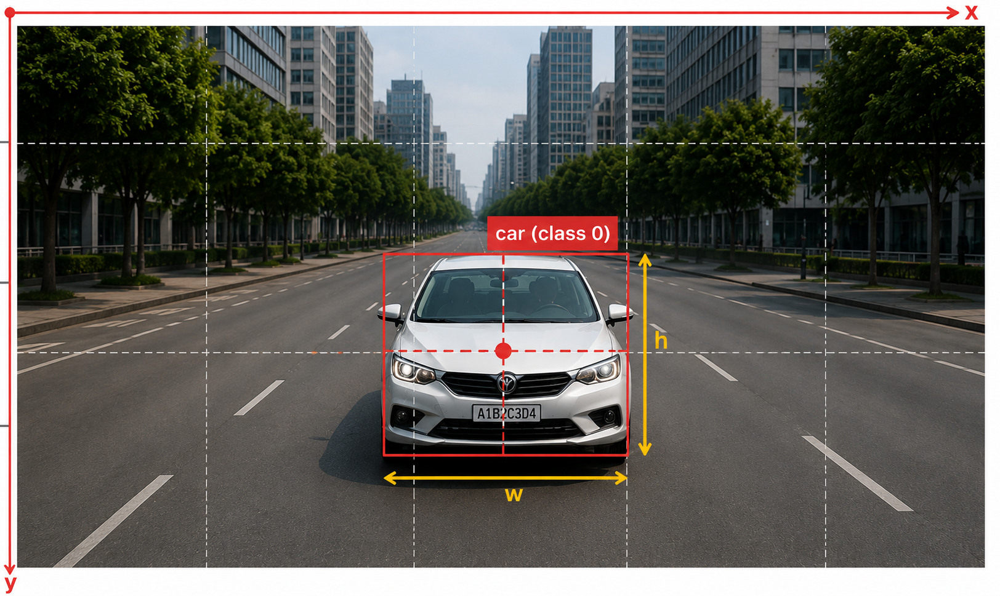

In [1]:
from google.colab import files
uploaded = files.upload()
from IPython.display import Image, display

display(Image('bbdemo2.png'))

YOLO11 follows the general YOLO idea: it processes the image and predicts object locations and classes efficiently.

YOLO11 is described by Ultralytics as using improved backbone and neck components for better feature extraction and detection performance.

The general detection process is:

```text
Input Image → Feature Extraction → Bounding Box Prediction → Class Prediction
```
Input Image: The image is passed into the model. For example `512 × 512` image.

Feature Extraction: The CNN layers learn important visual patterns such as `edges`, `textures`, `shapes`, `object parts`.

Bounding Box Prediction: The model predicts possible object locations using bounding boxes.

Class Prediction: The model assigns class probabilities to each detected object. For example `c₁ = 0.8, c₂ = 0.1, c₃ = 0.1`.

If
`c₁ = max(c₁, c₂, c₃)`, then the object belongs to class 1, depending on the class mapping.



## YOLO11 Predictions Using Bounding Boxes

YOLO11 is a modern object detection model that identifies and localizes objects in an image using bounding boxes, grid-based prediction, probability estimation, and deep neural network feature extraction. Like previous YOLO versions, it analyzes the entire image in a single forward pass, making it extremely fast and suitable for real-time applications.


To illustrate how YOLO11 works, suppose you want to built a YOLO application that detects players and soccer balls from a given image. YOLO11 receives the full image and attempts to identify: Players, Soccer balls, and other objects present in the scene. YOLO performs object detection by transforming image (A) into image (B) through several processing stages.

Saving bbox1.png to bbox1 (1).png


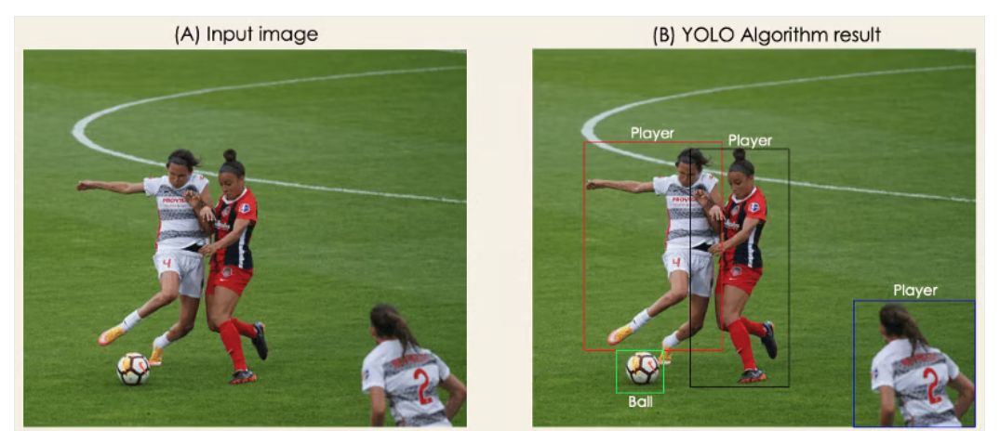

In [3]:
from google.colab import files
uploaded = files.upload();
from IPython.display import Image, display

display(Image('bbox1.png'))

The complete YOLO11 detection process can be understood through four major concepts: $i).$ Residual Blocks, $ii).$ Bounding Box Regression, $iii).$ Intersection over Union (IoU), and $iv).$ Non-Maximum Suppression (NMS).

Together, these stages allow YOLO11 to transform an ordinary image into a final detection output containing labeled objects and bounding boxes.

###Residual blocks:
Residual blocks are deep neural network structures responsible for extracting meaningful image features. These blocks help YOLO11 learn Edges, Shapes, Textures, Spatial patterns, etc.

After feature extraction, YOLO11 divides the image into an: $S×S$ grid system. For example: $4×4$ as shown in the image on the right. This produces 16 grid cells. Each cell in the grid is responsible for localizing and predicting the class of the object that it covers, along with the probability/confidence value.

Saving bbox2.png to bbox2.png


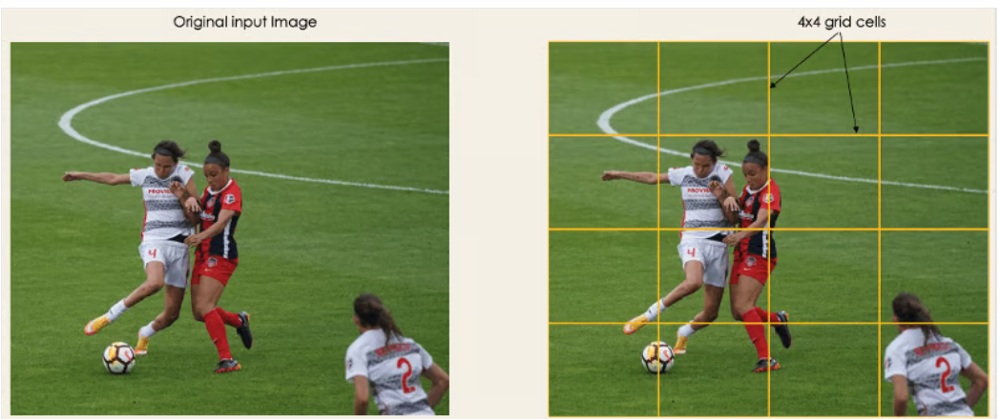

In [4]:
from google.colab import files
uploaded = files.upload();
from IPython.display import Image, display

display(Image('bbox2.png'))

### Grid Cells and Bounding Box Predictions in YOLO

In YOLO, the image is divided into an $ S \times S $ grid, where each grid cell predicts $( B )$ bounding boxes.

For example, when $S = 3$, the image is divided into $3 \times 3 = 9$ grid cells.

If each grid cell predicts four bounding boxesc, $B = 4$, then the total number of possible bounding-box predictions becomes:

$$
N = S \times S \times B
$$

Substituting the values:

$$
N = 3 \times 3 \times 4 = 36
$$

This means the model can generate up to **36 possible bounding-box predictions** before filtering techniques such as **Non-Maximum Suppression (NMS)** are applied.

Also, the output layer of a YOLO network depends on the number of grid cells, bounding boxes, and object classes used by the model.

For a YOLO model with an $ S \times S $ grid, $( B )$ bounding boxes per grid cell, and $( C )$ object classes, the total number of output neurons is computed as:

$$
N = S \times S \times (B \times 5 + C)
$$

The value $( 5 )$ corresponds to the bounding-box parameters:
$x, y, w, h,$ ${\rho}$.

where $( \rho )$ represents the confidence score.

For example, suppose $S = 6,\; B = 4,\; C = 15$,

Then:

$$
N = 6 \times 6 \times (4 \times 5 + 15)
$$

$$
N = 36 \times (20 + 15)
$$

$$
N = 36 \times 35
$$

$$
N = 1260
$$

Therefore, the network produces: $
1260$ output values.

### Bounding box regression
Each grid cell in YOLO11 predicts whether an object exists within its region, the coordinates of the corresponding bounding box, the probabilities of the object classes, and a confidence score. For example, a grid cell may predict the presence of a player or a soccer ball in the image. The confidence score represents how certain YOLO11 is, that an object is actually present inside that particular grid cell.

**Bounding Box Regression:**
The bounding box regression works in YOLO11 by identifying which grid cells are important for object detection and predicting bounding boxes only for those relevant regions. YOLO determines the attributes of these bounding boxes using a single regression module in the following format, where Y is the final vector representation for each bounding box.

$$
Y = [p_c,\; b_x,\; b_y,\; b_w,\; b_h,\; c_1,\; c_2,\; \ldots,\; c_n]
$$

where:
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;
| Parameter | Meaning |
|---|---|
| $p_c$ | Probability that the grid contains an object |
| $b_x$ | x-coordinate of the box center |
| $b_y$ | y-coordinate of the box center |
| $b_w$ | Width of the bounding box |
| $b_h$ | Height of the bounding box |
| $c_1 \ldots c_n$ | Class probabilities |


In the image on the left, the original $4×4$ grid is shown over the soccer scene. The red grid cells represent regions with probability scores greater than zero, meaning YOLO11 predicts that these cells contain objects such as players or the soccer ball. The yellow grid cells have probability scores equal to zero, indicating that no significant object is detected in those regions. During bounding box regression, YOLO11 focuses mainly on the significant red cells because they contain useful information for localization. The image on the right simplifies the process by removing the insignificant yellow cells and retaining only the important grid regions responsible for object prediction.

Each grid cell predicts the probability that an object exists within its region. Cells with high probabilities indicate likely object locations, while cells with low probabilities indicate the absence of objects. The confidence score helps YOLO11 determine which detections should be retained.


Saving bbox3.png to bbox3.png


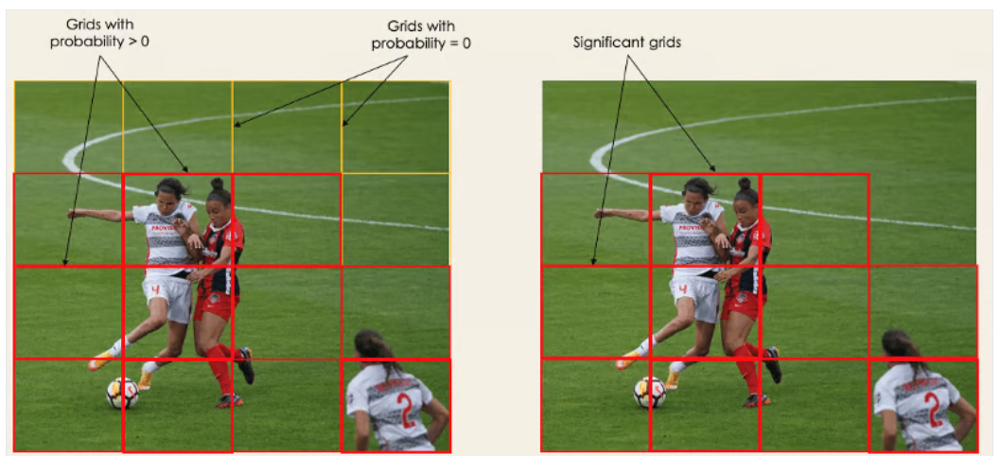

In [5]:
from google.colab import files
uploaded = files.upload();
from IPython.display import Image, display

display(Image('bbox3.png'))

To further demonstrate how bounding box regression is used in YOLO11 to localize objects precisely within an image, let us take a look at the image below. In the image on the left, the soccer scene is divided into grid cells, and YOLO11 predicts bounding boxes around detected objects such as the players and the soccer ball. The yellow stars indicate the centers of the predicted bounding boxes, showing that each object is assigned to the grid cell containing its center point. The blue rectangles represent the predicted bounding boxes generated by the model to surround each detected object.

The image on the right focuses on the player located at the bottom-right of the image to explain how the bounding box parameters are computed. The coordinates $ (b_x, b_y) $ represent the center of the bounding box relative to the surrounding grid cell, where:

&nbsp;&nbsp;&nbsp;&nbsp;The top-left corner of the grid cell is $ (0,0) $

&nbsp;&nbsp;&nbsp;&nbsp;The bottom-right corner is $ (1,1) $

The parameters $ b_w $ and $ b_h $ represent the width and height of the bounding box relative to the size of the grid cell, denoted by $( g_w )$ and $( g_h )$.

In this example:

&nbsp;&nbsp;&nbsp;&nbsp; &nbsp;&nbsp;&nbsp;&nbsp;$b_w \approx 1g_w$

while the height extends beyond the grid cell:

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;$b_h \approx \frac{2}{3}g_h$


showing that bounding boxes may span multiple grid cells when objects are large.

The prediction vector becomes:

$$
Y = [p_c,\; b_x,\; b_y,\; b_h,\; b_w,\; c_1,\; c_2]
$$

where:

&nbsp;&nbsp;&nbsp;&nbsp; $p_c$ indicates object presence

&nbsp;&nbsp;&nbsp;&nbsp; $ (b_x, b_y, b_h, b_w) $ define the localization of the object

&nbsp;&nbsp;&nbsp;&nbsp; $( c_1, c_2 )$ correspond to the probabilities of the classes **Player** and **Ball**

These images therefore illustrate how YOLO11 performs object localization and class prediction simultaneously using bounding box regression.

Saving bbox4.png to bbox4.png


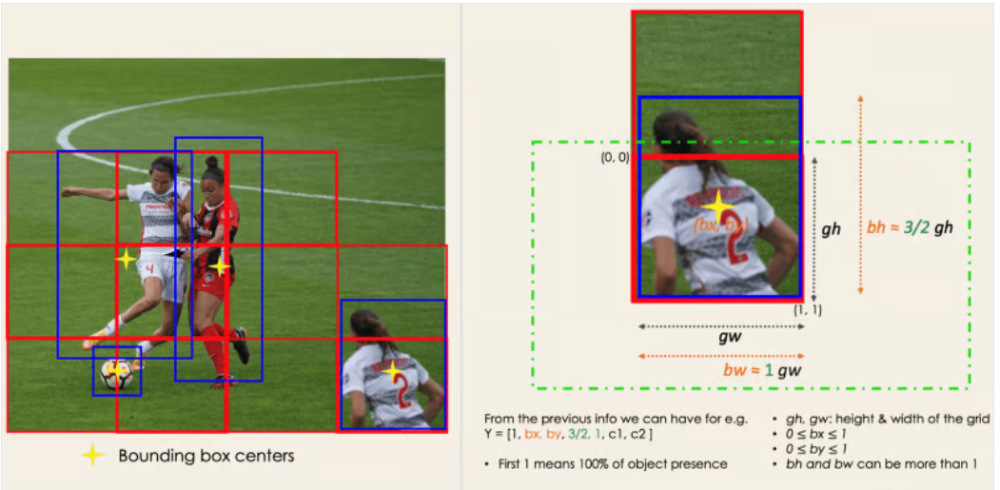

In [6]:
from google.colab import files
uploaded = files.upload();
from IPython.display import Image, display

display(Image('bbox4.png'))

### Intersection over Union (IoU)

Intersection over Union (IoU) is an evaluation metric used in YOLO and other object detection algorithms to measure how accurately a predicted bounding box matches the ground-truth bounding box. IoU is computed by dividing the area of overlap between the two boxes by the total combined area covered by both boxes. Mathematically, it is expressed as:

$
IoU = \frac{A_{intersection}}{A_{union}}
$

where $A_{intersection}$ represents the overlapping region between the predicted and ground-truth boxes, and $A_{union}$ represents the total area occupied by both boxes combined. The union area is computed as:

$
A_{union} = A_1 + A_2 - A_{intersection}
$

For example, suppose there is an overlap between two bounding boxes representing objects in an image. The two bounding boxes are defined as $A=(40,40,20,30)$ and $B=(45,45,10,10)$, where each tuple represents $(x,y,w,h)$. The area of bounding box $A$ can be computed as:

$
A_A = 20 \times 30 = 600
$

while the area of box $B is:

$
A_B = 10 \times 10 = 100
$

Since box $B$ lies completely inside box $A$, the overlapping area becomes:

$
A_{intersection} = 100
$

The union area is therefore:

$
A_{union} = 600 + 100 - 100 = 600
$

Thus, the $IoU$ value is:

$
IoU = \frac{100}{600}
$

$
IoU = \frac{1}{6} \approx 0.167
$

An IoU value of approximately $0.167$ indicates a relatively small overlap between the predicted and reference bounding boxes, meaning the prediction is not highly accurate. In practice, higher IoU values correspond to better object localization performance.

The image below illustrate how Intersection over Union (IoU) is used in YOLO11 to evaluate the accuracy of predicted bounding boxes and determine which prediction should be retained. In the image on the left, two grid cells, labeled Grid 1 and Grid 2, generate bounding boxes around the same player. The blue rectangle represents the predicted bounding box, while the red rectangle represents another candidate prediction. The overlapping shaded region between the two boxes corresponds to the intersection area, while the total combined region covered by both boxes represents the union area.

Saving bbox5.png to bbox5.png


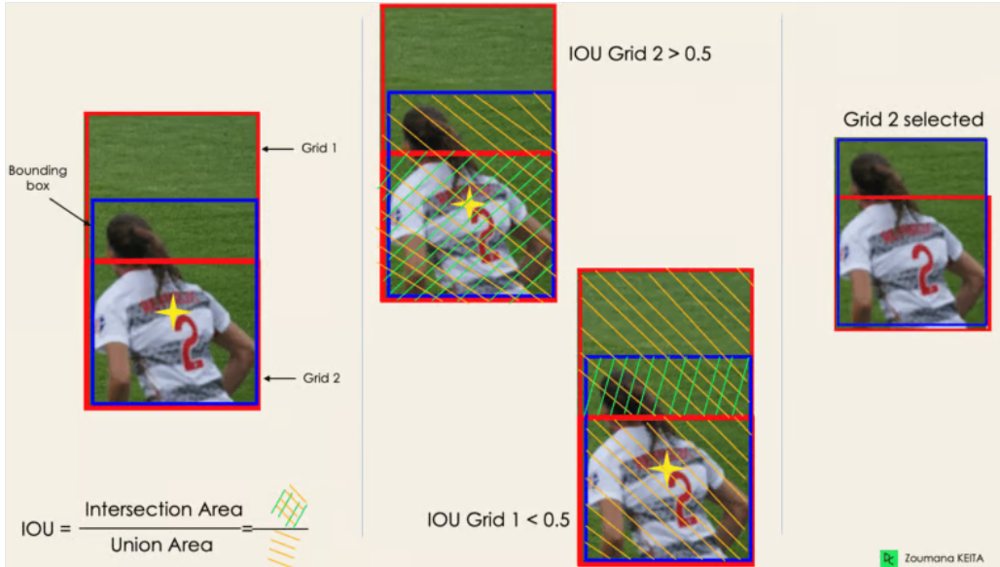

In [7]:
from google.colab import files
uploaded = files.upload();
from IPython.display import Image, display

display(Image('bbox5.png'))

The middle images compare the IoU values for the two grid predictions. In the upper example, Grid 2 has an IoU value greater than 0.5, meaning the predicted box overlaps well with the target object and is considered a good localization. In the lower example, Grid 1 has an IoU value less than 0.5, indicating poor overlap and inaccurate localization. As a result, the image on the right shows that Grid 2 is selected because it provides the most accurate bounding box prediction. These images therefore demonstrate how YOLO11 uses IoU to measure localization accuracy and retain the best object detection results.

## Non-Maximum Suppression (NMS)

**Non-Maximum Suppression (NMS)** is a post-processing technique used in object detection to remove duplicate or overlapping bounding boxes that correspond to the same object. The algorithm keeps the bounding box with the highest confidence score and suppresses other boxes that have a large overlap with it, typically measured using Intersection over Union (IoU). This helps produce cleaner and more accurate detection results by ensuring that each object is represented by only one final bounding box.


After predicting bounding boxes, YOLO11 may generate multiple bounding boxes around the same object. For example, several bounding boxes may appear around a single player or multiple boxes may surround the soccer ball. This occurs because different grid cells or prediction layers may detect the same object simultaneously. To address this issue, YOLO11 applies a technique called Non-Maximum Suppression (NMS).


Saving NMS.jpg to NMS.jpg


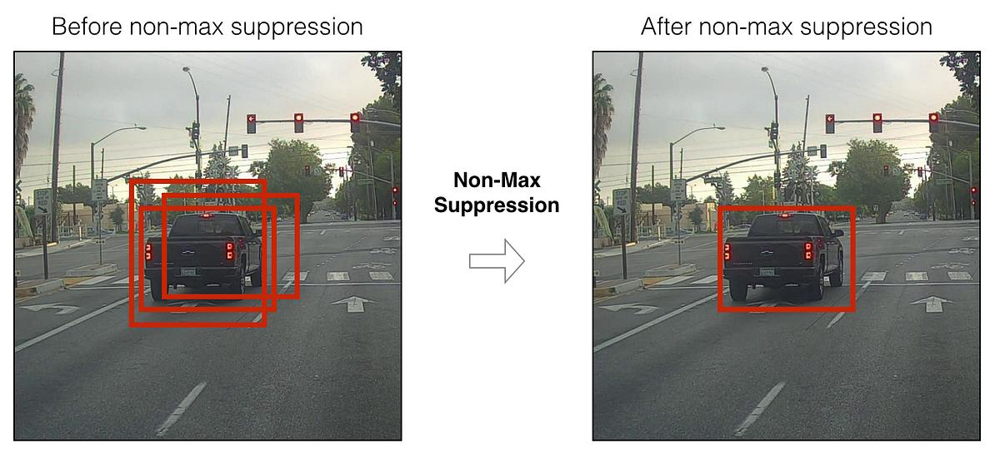

In [8]:
from google.colab import files
uploaded = files.upload();
from IPython.display import Image, display

display(Image('NMS.jpg'))

### Confidence Score and Detection Threshold
YOLO uses a confidence score to estimate whether a predicted bounding box contains an object.
Let: $ \rho = \text{confidence score}$.

If the detection threshold is defined as $
\rho > 0.5.$ then any bounding box with a confidence score greater than \(0.5\) is considered a valid object detection.

For example, suppose: $
\rho = 0.8.$ Since $
0.8 > 0.5,$ the bounding box is accepted as containing a detected object. However, if: $
\rho = 0.3$ then: $
0.3 < 0.5.$ The bounding box is rejected because the confidence score is too low.

### Worked Example

Suppose YOLO11 is trained to detect three object classes: $
0=\text{car}, \quad 1=\text{motorcycle}, \quad 2=\text{bus}
$. Also Let: $
C=3, \quad B=2, \quad S=2$. Each grid cell predicts two bounding boxes together with the class probabilities. The output values for each grid cell are arranged as:

$$
\rho_1,x_1,y_1,h_1,w_1,\rho_2,x_2,y_2,h_2,w_2,c_1,c_2,c_3
$$

The total number of output neurons is computed using:

$$
N=S \times S \times (B \times 5 + C)
$$

Substituting the values gives:

$$
N=2 \times 2 \times (2 \times 5 + 3)
$$

$$
N=4 \times 13
$$

$$
N=52
$$

Therefore:

$$
N=52
$$

This means the YOLO11 network produces \(52\) output values for the entire image.

Given that the $(512 \times 512)$ image is divided into four grid cells labeled $(A)$, $(B)$, $(C)$, and $(D)$, representing the upper-left, upper-right, lower-left, and lower-right regions of the image, respectively. Each grid cell produces output values containing confidence scores, bounding-box coordinates, and class probabilities. The model outputs are:

```
Block A: 0, 0.2, 0.1, 0.2, 0.4, 0, 0.25, 0.15, 0.2, 0.3, 0.2, 0.2, 0.6
Block B: 0, 0.1, 0.8, 0.2, 0.3, 0.8, 0.2, 0.7, 0.2, 0.3, 0.8, 0.1, 0.1
Block C: 0, 0.7, 0.1, 0.2, 0.4, 0, 0.75, 0.3, 0.2, 0.3, 0.2, 0.6, 0.2
Block D: 0.9, 0.8, 0.7, 0.2, 0.1, 0, 0.6, 0.8, 0.1, 0.3, 0.1, 0.7, 0.2
```

The model uses a confidence threshold defined as $\rho > 0.5$ to determine whether a predicted bounding box contains an object. Let us take a look at the dataset again:

| Block |$\rho_1$ | $x_1$ | $y_1$ | $h_1$ | $w_1$ | $\rho_2$ | $x_2$ | $y_2$ | $h_2$ | $w_2$ | $c_1$ | $c_2$ | $c_3$ |
|---|---|---|---|---|---|---|---|---|---|---|---|---|---|
| A | 0 | 0.2 | 0.1 | 0.2 | 0.4 | 0 | 0.25 | 0.15 | 0.2 | 0.3 | 0.2 | 0.2 | 0.6 |
| B | 0 | 0.1 | 0.8 | 0.2 | 0.3 | 0.8 | 0.2 | 0.7 | 0.2 | 0.3 | 0.8 | 0.1 | 0.1 |
| C | 0 | 0.7 | 0.1 | 0.2 | 0.4 | 0 | 0.75 | 0.3 | 0.2 | 0.3 | 0.2 | 0.6 | 0.2 |
| D | 0.9 | 0.8 | 0.7 | 0.2 | 0.1 | 0 | 0.6 | 0.8 | 0.1 | 0.3 | 0.1 | 0.7 | 0.2 |


To identify valid detections, the confidence scores $(\rho_1)$ and $(\rho_2)$ from each grid cell are examined. Grid cells $(A)$ and $(C)$ both have confidence scores equal to zero, meaning no object is detected in those regions. However, Block $(B)$ contains a second confidence score of: $
\rho_2 = 0.8$.

Since: $
0.8 > 0.5$, YOLO11 determines that an object exists in Block $(B)$. The class probabilities for this block are:

$$
c_1 = 0.8,\quad c_2 = 0.1,\quad c_3 = 0.1
$$

$c_1 = max(c_1, c_2, c_3).$

The largest probability corresponds to $(c_1)$, which represents the class **car**. Therefore, the detected object in Block $(B)$ is classified as a car. The associated bounding-box coordinates are:

$
x_2 = 0.2,\quad y_2 = 0.7,\quad h_2 = 0.2,\quad w_2 = 0.3
$


Similarly, Block \(D\) contains a first confidence score of: $
\rho_1 = 0.9
$

Since $
0.9 > 0.5$, an object is also detected in Block $(D)$. The class probabilities for this block are:

$$
c_1 = 0.1,\quad c_2 = 0.7,\quad c_3 = 0.2
$$

The largest probability is $(c_2 = max(c_1,c_2,c_3) = 0.7)$, corresponding to the class **motorcycle**. Hence, YOLO11 classifies the detected object in Block $(D)$ as a motorcycle. The corresponding bounding-box values are:

$$
x_1 = 0.8,\quad y_1 = 0.7,\quad h_1 = 0.2,\quad w_1 = 0.1
$$

After evaluating all four grid cells, YOLO11 detects two objects in the image:

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;One car in Block $(B).$

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;One motorcycle in Block $(D).$

Therefore, the total number of detected objects is: $
2. $

## YOLO 11 Architecture

The YOLO11 architecture is mainly composed of three major components: Backbone, Neck, and Head. These components work together to extract image features, combine spatial information, and generate final object predictions.

### Backbone
The first component, known as the Backbone, is responsible for feature extraction. This stage processes the input image through several convolutional and residual-learning layers to learn important visual features such as edges, textures, shapes, and object structures. The backbone progressively transforms the raw image into deep feature maps that contain rich semantic information. YOLO11 uses advanced modules such as CSP blocks, C3k2 blocks, and SPPF layers to improve gradient flow, feature reuse, and computational efficiency. These improvements help the network detect both small and large objects more effectively.


### Neck
The second component is the Neck, which performs feature fusion. The neck combines feature maps extracted at different scales by the backbone using structures such as PAN-FPN (Path Aggregation Network and Feature Pyramid Network). This allows YOLO11 to merge low-level spatial information with high-level semantic information. As a result, the model becomes more effective at detecting objects of different sizes, including small and distant objects that are often difficult to identify. The neck also performs operations such as upsampling, downsampling, and concatenation to refine the feature representations before prediction.


### Head
The final component is the Head, which performs the actual prediction task. The head receives the fused feature maps from the neck and predicts the bounding-box coordinates, confidence scores, and object class probabilities. YOLO11 uses decoupled detection heads, meaning that localization and classification are handled by separate branches. This improves prediction accuracy and training stability. The head produces the final detections by determining where objects are located, how confident the model is about their presence, and which classes they belong to.



Saving yoloarch.png to yoloarch.png


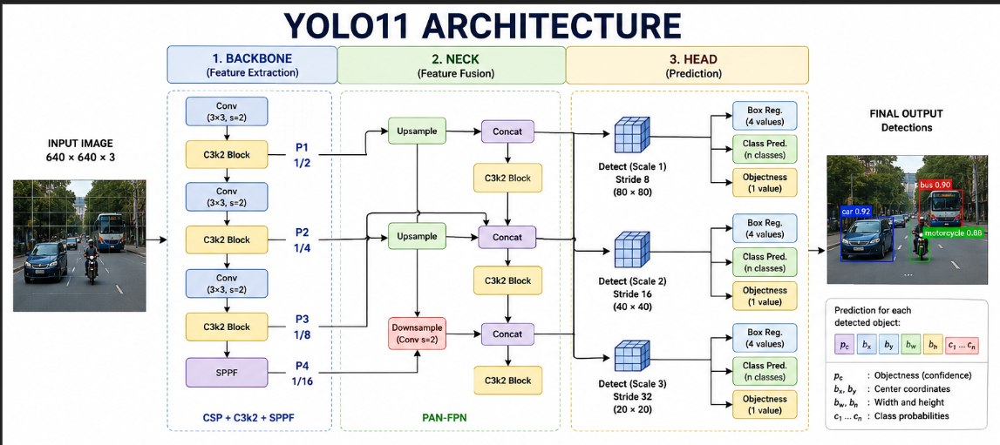

In [3]:
from google.colab import files
uploaded = files.upload();
from IPython.display import Image, display

display(Image('yoloarch.png'))

## Features in the YOLO11 Architecture

The YOLO11 architecture contains several important modules that work together to extract features, combine information, and generate object detections. Each module has a specific role in the detection pipeline.

1. Conv (Convolution Layer)

The Conv layer is the basic feature extraction operation in YOLO11. It applies convolution filters to the input image or feature maps to learn visual patterns such as Edges, Corners, Shapes, and Textures. In the architecture, layers such as `Conv (3×3, s=2)` mean $ 3 \times 3$ convolution kernel and stride $s=2.$

The stride reduces the spatial size of the feature map while increasing semantic information. The Conv layers help the model progressively transform the raw image into meaningful feature representations.

2. C3k2 Block

The C3k2 block is an improved feature-learning module based on CSP (Cross Stage Partial) networks. It contains convolutional and residual-learning structures that improve **Gradient flow, Feature reuse, Computational efficiency, and Deep feature learning**.

C3k2 blocks allow YOLO11 to learn richer and more detailed visual information while reducing computational cost compared to standard convolution layers.

These blocks are responsible for extracting complex object features from the image.

3. SPPF (Spatial Pyramid Pooling Fast)

The SPPF module appears near the end of the Backbone.

SPPF stands for **Spatial Pyramid Pooling Fast**. It performs multi-scale pooling operations to capture contextual information from different receptive fields.

SPPF helps the network understand: Large objects, Spatial relationships, and Global image context.

Benefits include: Faster computation, Better context understanding, and Improved object detection accuracy.

4. P1, P2, P3, P4 Feature Maps

The labels ```P1, P2, P3, P4``` represent feature maps generated at different resolutions inside the Backbone.

| Feature Map | Resolution Scale |
|---|---|
| P1 | 1/2 |
| P2 | 1/4 |
| P3 | 1/8 |
| P4 | 1/16 |


As the network goes deeper **Feature-map size decreases** and **Semantic information increases**.

Lower-level feature maps preserve fine spatial details, while deeper feature maps capture richer semantic information.

These feature maps are later fused in the Neck for multi-scale detection.

5. Upsample

The Upsample operation increases the spatial resolution of feature maps. It enlarges smaller feature maps so they can be combined with higher-resolution feature maps from earlier layers.

Upsampling helps preserve Fine object details, Small-object information, and Spatial accuracy. This is especially important for detecting small objects such as Balls, Distant vehicles, and Small pedestrians.

6. Downsample

The Downsample operation reduces the spatial resolution of feature maps.

This allows the network to Increase receptive fields, Capture higher-level semantic features, and Reduce computational complexity.

Downsampling helps the model detect larger objects and broader image structures.

7. Concat (Concatenation)

The **Concat** operation combines feature maps from different layers into a single feature representation.

This merges Low-level spatial features and High-level semantic features. Concatenation improves Multi-scale learning, Object localization, and Detection accuracy.

By combining multiple feature maps, YOLO11 becomes more effective at detecting objects of different sizes.


8. Detect (Scale 1, Scale 2, Scale 3)

The Detect layers are the final prediction modules of YOLO11.

YOLO11 performs detection at multiple scales:

| Detection Scale | Feature Map Size | Purpose |
|---|---|---|
| Scale 1 | 80×80 | Small objects |
| Scale 2 | 40×40 | Medium objects |
| Scale 3 | 20×20 | Large objects |

Each Detect layer predicts:

    i).  Bounding-box coordinates
    ii). Object confidence scores
    iii). Class probabilities

The multi-scale detection strategy allows YOLO11 to accurately detect Small objects, Medium objects, and Large objects within the same image.

## YOLO Annotation Format

The YOLO annotation format is the standard way of writing object labels so that a YOLO model can learn from images. In object detection, each image usually has a corresponding text file with the same filename. Example `image1.jpg and image1.txt`.

The `.txt` file contains the annotations for all objects present in that image.

In YOLO11 object detection, each line in the label file represents one object and is written in the following format as earlier discuseed: `
class_id x_center y_center width height`.

These five values are separated by spaces. The Meaning of the values include;

- **class_id**: the numerical label assigned to the object class  
- **x_center**: the x-coordinate of the center of the bounding box  
- **y_center**: the y-coordinate of the center of the bounding box  
- **width**: the width of the bounding box  
- **height**: the height of the bounding box  

A key point is that the last four values are **normalized**, not given in raw pixels. This means they are divided by the image width or height, so they usually fall between 0 and 1.

#### Example

A label file may contain:

```
0 0.50 0.40 0.30 0.20
1 0.70 0.65 0.15 0.25
```

This means:

- the first object belongs to class 0, with center at (0.50, 0.40), width 0.30, and height 0.20  
- the second object belongs to class 1, with center at (0.70, 0.65), width 0.15, and height 0.25  

If the class names are defined as:

```yaml
names:
  0: mango
  1: palm
```

then the image contains one mango and one palm.


A typical YOLO dataset is arranged as follows:

```
dataset/
├── images/
│   ├── train/
│   ├── val/
│   └── test/
├── labels/
│   ├── train/
│   ├── val/
│   └── test/
```

Each image should have a matching label file in the corresponding labels folder.

Example:

```
images/train/img001.jpg
labels/train/img001.txt
```

## Class Mapping in YAML

YOLO also uses a `.yaml` file to define the dataset path and class names:

```yaml
path: /content/dataset
train: images/train
val: images/val

names:
  0: mango
  1: palm
  2: other
```

This file tells YOLO what each class ID represents.


## YOLO Training with YOLO11

YOLO11 is one of the Ultralytics YOLO model families, and the official docs show that YOLO11 models support training, validation, inference, and export across multiple tasks. For object detection, the common pretrained model names include variants such as `yolo11n.pt`, `yolo11s.pt`, `yolo11m.pt`, `yolo11l.pt`, and `yolo11x.pt`.

To train YOLO11, the practical workflow is simple: prepare the dataset, create the YAML file, choose a pretrained YOLO11 model, start training, monitor validation results, and then save the best weights for inference or further fine-tuning. Ultralytics uses the same general CLI syntax:

```
yolo TASK MODE ARGS
```

and its Python API follows the same pattern through:

```python
model.train(...)
```

#### 1. Prepare the Dataset

For YOLO11 object detection, your dataset should contain images and matching label files in YOLO format. The dataset configuration is defined using a YAML file that points to the training and validation image folders and defines the class names.

A typical structure is:

```
dataset/
├── images/
│   ├── train/
│   └── val/
├── labels/
│   ├── train/
│   └── val/
```

Each image must have a corresponding `.txt` label file with the same filename in the matching labels folder.

#### 2. Create the Dataset YAML File

You then create a dataset YAML file such as `data.yaml`. This file tells YOLO11 where the data is and what the class IDs mean.

Example:

```yaml
path: /path/to/dataset
train: images/train
val: images/val

names:
  0: mango
  1: palm
  2: other
```

- `path`: dataset root  
- `train`, `val`: image folders  
- `names`: class ID mapping  

#### 3. Choose a YOLO11 Model

It is recommended to start from pretrained weights.

Available options:

- `yolo11n.pt` → small, fast  
- `yolo11s.pt` → slightly larger  
- `yolo11m.pt`, `yolo11l.pt`, `yolo11x.pt` → larger, more accurate  

#### 4. Start Training from the Command Line

Ultralytics CLI syntax:

```
yolo detect train model=yolo11n.pt data=data.yaml epochs=100 imgsz=640
```

Meaning:

- `detect` → object detection task  
- `train` → training mode  
- `model` → pretrained weights  
- `data` → dataset config  
- `epochs` → training iterations  
- `imgsz` → image size  

#### 5. Start Training in Python

```python
from ultralytics import YOLO

model = YOLO("yolo11n.pt")
results = model.train(data="data.yaml", epochs=100, imgsz=640)
```

#### 6. What Happens During Training

During training:

- Images are loaded in batches  
- Predictions are made  
- Compared with ground truth  
- Loss is computed  
- Weights are updated  

Key hyperparameters include:
- batch size  
- learning rate  
- momentum  
- weight decay  

#### 7. Important Training Arguments

- `model`: pretrained `.pt` file  
- `data`: dataset YAML  
- `epochs`: number of training epochs  
- `imgsz`: image size  
- `batch`: batch size  
- `device`: CPU or GPU  
- `workers`: data loader workers  

Example:

```
yolo detect train model=yolo11s.pt data=data.yaml epochs=100 imgsz=640 batch=16 device=0
```

#### 8. Validation During and After Training

CLI:

```
yolo detect val model=runs/detect/train/weights/best.pt data=data.yaml
```

Python:

```python
from ultralytics import YOLO

model = YOLO("runs/detect/train/weights/best.pt")
metrics = model.val(data="data.yaml")
```

#### 9. Using the Trained YOLO11 Model

After training, use the saved weights for inference.

Example:

```
yolo detect predict model=runs/detect/train/weights/best.pt source=path/to/image.jpg
```

## 10. Step-by-Step Summary

- collect images  
- annotate in YOLO format  
- organize `images/` and `labels/`  
- create `data.yaml`  
- choose pretrained model (e.g., `yolo11n.pt`)  
- run training  
- validate results  
- use `best.pt` for inference  

## Minimal Example

```
yolo detect train model=yolo11n.pt data=data.yaml epochs=100 imgsz=640
```

This is the simplest way to train YOLO11 on a custom dataset using the Ultralytics workflow.


## Practical Implementation
#### YOLO11 Training in Google Colab

#### Install Ultralytics

```python
!pip install -q ultralytics
```

#### Mount Google Drive

```python
from google.colab import drive
drive.mount('/content/drive')
```

#### Import Libraries

```python
from ultralytics import YOLO
import yaml, os
```

#### Define Dataset Path

```python
dataset_root = "/content/drive/MyDrive/yolo_dataset"
```

#### Create Dataset YAML File

```python
data = {
    "path": dataset_root,
    "train": "images/train",
    "val": "images/val",
    "names": {
        0: "mango",
        1: "palm",
        2: "other"
    }
}

yaml_path = "/content/data.yaml"
with open(yaml_path, "w") as f:
    yaml.dump(data, f, sort_keys=False)
```

---

#### Load Pretrained YOLO11 Model

```python
model = YOLO("yolo11n.pt")
```

#### Train the Model

```python
model.train(
    data=yaml_path,
    epochs=100,
    imgsz=640,
    batch=16,
    project="/content/runs",
    name="yolo11_custom"
)
```

#### Validate the Model

```python
best_model = YOLO("/content/runs/yolo11_custom/weights/best.pt")
best_model.val(data=yaml_path)
```

#### Run Inference (Prediction)

```python
best_model.predict(
    source="/content/drive/MyDrive/test_image.jpg",
    save=True,
    conf=0.25
)
```

#### Equivalent CLI Commands

Ultralytics documents the CLI pattern as:

```
yolo TASK MODE ARGS
```
The same workflow can be written in CLI form.

#### Train

```bash
!yolo detect train model=yolo11n.pt data=/content/data.yaml epochs=100 imgsz=640 batch=16
```
#### Validate

```bash
!yolo detect val model=runs/detect/train/weights/best.pt data=/content/data.yaml
```
#### Predict

```bash
!yolo detect predict model=runs/detect/train/weights/best.pt source=/content/drive/MyDrive/test_image.jpg
```
#### Practical Tips
Start with **`yolo11n.pt`** because it is lighter and faster. Move to **`yolo11s.pt`** or **`yolo11m.pt`** for better performance  

YOLO11 is designed to be fast and efficient, so this progression helps balance **speed vs accuracy**.

#### Dataset Tips

If your dataset is small, start with fewer classes and ensure labels are clean and accurate. Training quality depends heavily on: Correct annotations and Proper train/validation split.  

This is why Ultralytics emphasizes:dataset structure and YAML configuration  

## Roboflow

Roboflow is a web-based computer vision platform used to manage image datasets, annotate images, preprocess and augment data, create dataset versions, and export datasets for model training. Roboflow’s annotation tool supports tasks such as object detection, instance segmentation, keypoint detection, and classification. Its workflow is built around generating a **dataset version**, which is a frozen snapshot of your data and settings at a specific point in time.

#### Roboflow in YOLO11 Workflow

In a YOLO11 workflow, Roboflow is most useful at the **data preparation stage**.

A common pipeline is Upload images, Annotate objects, Choose preprocessing and augmentation settings, Generate a dataset version, and Export or download the dataset  

Roboflow provides tools for labeling, preprocessing, and augmentation, while YOLO11 uses the prepared dataset for training.

#### Dataset Versioning in Roboflow

A key concept in Roboflow is **dataset versioning**.

After labeling your data:

1. Go to the **Versions** page  
2. Choose:
   - Train/validation/test split  
   - Preprocessing options  
   - Augmentation settings  
3. Click **Generate New Version**

You must create a dataset version before exporting or downloading it.

#### Exporting for YOLO11

After generating a version:

- Export the dataset in a YOLO-compatible format  
- Use it for training in Colab or locally  

Roboflow’s YOLO11 guides recommend:

- First train **without augmentation** (baseline)  
- Then experiment with augmented versions  

#### Roboflow vs YOLO11

- **Roboflow** → Data preparation (annotation, cleaning, versioning)  
- **YOLO11** → Model training and prediction  

Roboflow is not the model; it is a **data preparation platform**.

#### Practical Roboflow → YOLO11 Workflow

1. Upload images to Roboflow  
2. Annotate objects  
3. Generate a dataset version (with optional preprocessing/augmentation)  
4. Export or download the dataset  
5. Train YOLO11 using the exported data  

#### Key Insight

Roboflow helps you create **clean, organized, versioned datasets**, while YOLO11 uses that data to learn and detect objects effectively.



### CNN Evaluation Metrics

CNN evaluation metrics are the measures used to check how well a Convolutional Neural Network performs on unseen data. The exact metric depends on the task. For image classification, the most common metrics are accuracy, precision, recall, F1-score, confusion matrix, and loss. For object detection and segmentation, other metrics such as IoU and mAP are also important.

## 1. Accuracy

Accuracy measures the proportion of correctly classified samples out of all samples.

$$
\text{Accuracy} = \frac{TP + TN}{TP + TN + FP + FN}
$$

Where:  
    &nbsp;&nbsp;&nbsp;&nbsp;TP = True Positives  
    &nbsp;&nbsp;&nbsp;&nbsp;TN = True Negatives  
    &nbsp;&nbsp;&nbsp;&nbsp;FP = False Positives  
    &nbsp;&nbsp;&nbsp;&nbsp;FN = False Negatives  

Accuracy is useful when classes are balanced, but can be misleading for imbalanced datasets.

#### 2. Precision

Precision shows how many of the samples predicted as positive are actually positive.

$$
\text{Precision} = \frac{TP}{TP + FP}
$$

A high precision means fewer false positives.

#### 3. Recall

Recall (sensitivity) measures how many actual positive samples are correctly identified.

$$
\text{Recall} = \frac{TP}{TP + FN}
$$

A high recall means fewer missed positive cases.

#### 4. F1-Score

The F1-score is the harmonic mean of precision and recall.

$$
F1 = 2 \cdot \frac{\text{Precision} \cdot \text{Recall}}{\text{Precision} + \text{Recall}}
$$

Useful for imbalanced datasets.

#### 5. Specificity

Specificity measures how well the model identifies negative samples.

$$
\text{Specificity} = \frac{TN}{TN + FP}
$$

## 6. Confusion Matrix

A confusion matrix summarizes classification results:

- True Positive (TP): correctly predicted positives  
- True Negative (TN): correctly predicted negatives  
- False Positive (FP): incorrect positive prediction  
- False Negative (FN): incorrect negative prediction  

It helps identify the types of errors made by the model.

#### 7. Loss

Loss measures how far predictions are from true labels.

- Goal: minimize loss during training  
- Common loss: **cross-entropy loss**

Lower loss generally indicates better learning, but should be evaluated alongside other metrics.

#### 8. ROC Curve and AUC

- ROC curve shows True Positive Rate vs False Positive Rate  
- AUC summarizes the ROC curve  

```
AUC = 1   → perfect model  
AUC = 0.5 → random guessing  
```

Higher AUC indicates better class separation.

#### 9. Top-1 and Top-5 Accuracy

Used in multi-class classification:

**Top-1 Accuracy**: correct class is highest prediction  
**Top-5 Accuracy**: correct class is within top 5 predictions  

Common in large-scale classification tasks.

## Metrics for Detection and Segmentation

#### 10. Intersection over Union (IoU)

IoU measures overlap between predicted and true regions.

$$
\text{IoU} = \frac{\text{Area of Overlap}}{\text{Area of Union}}
$$

Higher IoU means better localization.

#### 11. mAP (Mean Average Precision)

mAP evaluates detection performance across classes and IoU thresholds.

- Higher mAP → better detection performance  


## Freezing layers in YOLO11

In YOLO11 training, freezing layers means keeping some pretrained layers unchanged while training the rest of the model. Ultralytics exposes this through the freeze training argument, which can freeze either the first N layers or specific layers by index. This is mainly used for transfer learning and fine-tuning.

#### What freezing does

When a layer is frozen, its weights are not updated during backpropagation. In practice, this means the early feature-extraction part of the model can stay fixed while the later layers adapt to your new dataset. Ultralytics notes that freezing reduces the number of trainable parameters and is useful for fine-tuning.

#### Why use it

Freezing is helpful when you are training YOLO11 on a small or specialized dataset, because the pretrained backbone already knows general visual features such as edges, textures, and shapes. A common strategy is to freeze the backbone first, let the detection head adapt, and then optionally unfreeze everything later for full fine-tuning. Ultralytics specifically recommends this pattern in its custom trainer guide.

#### How to use freeze

Ultralytics supports two main forms:

- `freeze=10` freezes the first 10 layers.  
- `freeze=[0, 1, 2, 3]` freezes specific layers by index.  

A simple YOLO11 CLI example is:

```bash
yolo detect train model=yolo11n.pt data=data.yaml epochs=100 freeze=10
```

A Python example is:

```python
from ultralytics import YOLO

model = YOLO("yolo11n.pt")
model.train(data="data.yaml", epochs=100, freeze=10)
```

The same training argument is documented in Ultralytics’ general training/configuration docs and applies to current Ultralytics YOLO training workflows.

#### What value should you choose?

A practical starting point is:

- No freezing if you have a large, diverse dataset.  
- Freeze a few early layers if your dataset is small but similar to common object datasets.  
- Freeze more of the backbone if you want the head to adapt first and avoid over-changing the pretrained features early in training.  

Ultralytics’ custom trainer guide gives `freeze=10` as the example for freezing the first 10 layers, noting this is typically the backbone in YOLO architectures. The exact best value can vary by model and architecture, so it is something to test experimentally.

#### Gradual unfreezing

Ultralytics also documents a callback-based approach where you freeze layers at the start and then unfreeze them after a chosen number of epochs. Their example uses an `on_train_epoch_start` callback to unfreeze all parameters after a fixed number of epochs. This is useful when you want a staged fine-tuning schedule.

#### BatchNorm caution

Ultralytics also provides a callback example for putting frozen BatchNorm layers into evaluation mode so their running statistics do not keep changing. This is an advanced option, but it can matter when you are deliberately freezing part of the network.


# Worked Examples


1. Why is object detection typically more difficult than object classification?

Object detection is more difficult than object classification because an image may contain several objects from different classes, or multiple objects from the same class. In addition to identifying what each object is, the model must also determine the exact location of each object in the image.

Therefore, object detection involves both:

$i).$ classification, which identifies the object category;

$ii).$ localization, which determines where the object is located.


2. What is the difference between semantic segmentation and instance segmentation?

Semantic segmentation assigns a class label to every pixel in an image. Pixels belonging to the same class receive the same label, regardless of whether they belong to different objects.

Instance segmentation, on the other hand, not only labels each pixel by class but also separates individual objects of the same class.

For example, if an image contains three cars, semantic segmentation identifies all car pixels as “car,” while instance segmentation distinguishes Car 1, Car 2, and Car 3 separately.


3. What is a bounding box in object detection?

A bounding box is a rectangular box used to indicate the position and size of an object in an image.

It is usually represented by coordinates such as:

```text
  x_center, y_center, width, height
```

The bounding box helps the object detection model identify where the object is located within the image.


4. What are the two stages of object detection in R-CNN?

The two main stages of object detection in R-CNN are:

1. Object localization:  The model first identifies possible regions in the image where objects may be present.

2. Object classification: Each proposed region is then classified to determine the object category.

Therefore, R-CNN performs both localization and classification.


5. Calculate the intersection over union (IoU) between two objects, with the "bounding boxes" below, where the numbers represent $x, y, w, h,$ with $(x, y)$ being the center, $w$ and $h$ the width and height.

```text
Box A: 40, 40, 20, 30
Box B: 45, 45, 10, 10
```

The first box has area:

$$
\text{Area A} = 20 \times 30 = 600
$$

The second box has area:

$$
\text{Area B} = 10 \times 10 = 100
$$

Since the smaller box is inside the larger box (see the diagram below), the intersection area is:

$$
\text{Intersection} = 10 \times 10 = 100
$$

The union area is:

$$
\text{Union} = \text{Area A} + \text{Area B} - \text{Intersection}
$$

$$
\text{Union} = 600 + 100 - 100
$$

$$
\text{Union} = 600
$$

Therefore, the Intersection over Union is:

$$
\text{IoU} = \frac{\text{Intersection}}{\text{Union}}
$$

$$
\text{IoU} = \frac{100}{600}
$$

$$
\text{IoU} = \frac{1}{6}
$$

$$
\text{IoU} \approx 0.167
$$

So, the IoU is approximately:

$$
0.167
$$




Saving exemplo5.png to exemplo5 (1).png


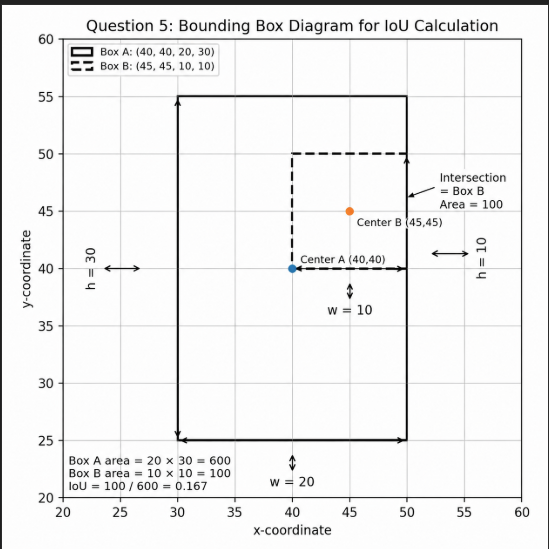

In [2]:
from google.colab import files
uploaded = files.upload();
from IPython.display import Image, display

display(Image('exemplo5.png'))

6. How do CNN networks dispense with the parameter extraction step from prior knowledge like "color SIFT"?

Traditional computer vision methods often require manual feature extraction techniques such as SIFT, color SIFT, or other handcrafted descriptors.

CNNs avoid this manual feature engineering because they automatically learn useful image features during training. Through convolutional layers, the network learns patterns such as edges, textures, shapes, and object parts.

As training progresses, the CNN adjusts its filters to recognize important visual patterns directly from the data. Therefore, CNNs remove the need for manually designing feature extractors.


7. What is the role of SVMs in the original R-CNN network?

In the original R-CNN, Support Vector Machines were used for classification.

After region proposals were generated and CNN features were extracted from each region, SVMs classified those regions into object classes.

Therefore, the role of the SVMs was to determine the class of each proposed object region.

8. Why does YOLO11 use different activation functions and separate prediction branches in its detection head?

YOLO11 uses separate prediction branches because classification, bounding box regression, and objectness estimation are different tasks. Different activation functions are used to handle different output types, such as probabilities for classification and coordinates for localization. This decoupled design improves detection accuracy, localization performance, and training efficiency.

9. Assume that a YOLO network is being used to predict objects in an image with a large number of pixels. The S x S grid is given by the choice S = 3. For each grid block, B = 4 possible "bounding boxes" are defined. In this case, what is the maximum number of objects that can be detected per image?

Given $S = 3, B = 4;$

The maximum number of objects that can be detected is:

$N = S × S × B$

$N = 3 × 3 × 4$

$N = 36$

Therefore, the maximum number of objects that can be detected is:

36 objects

10. What is the number of output neurons of a YOLO network that works with S x S grids, where S = 6, using B = 4 "bounding boxes" per grid block and aiming to detect C = 15 objects?

Given:
$
S = 6,
B = 4,
C = 15.
$

The YOLO output size is calculated as $N$:

  $N = S × S × (B × 5 + C)$

Where:

$S × S$ = number of grid cells,
$B$ = number of bounding boxes per grid cell,
$5 = x, y, w, h,$ and
confidence $C$ = number of classes.

$
N = 36 × (20 + 15)$

$N = 36 × 35$

$N = 1260$

Therefore, the YOLO network has $1260$ output neurons

11. A YOLO object detection model is designed to detect $( C = 3 )$ object classes, where ```0 = car```, ```1 = motorcycle```, and ```2 = bus```

The model uses ```B = 2``` bounding boxes per grid cell, and an $
S \times S$ grid with $S = 2$. For each grid cell, the network predicts the following 13 values:

$$
\rho_1,\; x_1,\; y_1,\; h_1,\; w_1,\; \rho_2,\; x_2,\; y_2,\; h_2,\; w_2,\; c_1,\; c_2,\; c_3
$$

where $\rho $ = object confidence score, $(x,y)$ = bounding box center coordinates, $ h $ = height, $ w $ = width, and $ (c_1,c_2,c_3)$ = class probabilities

The network output size is:

$$
N = S \times S \times (B \times 5 + C)
$$

$$
N = 2 \times 2 \times (2 \times 5 + 3) = 52
$$

For a $( 512 \times 512 )$ input image, the YOLO outputs for the four grid blocks are:

| Block | \( $\rho_1$ \) | \( $x_1$ \) | \( $y_1$ \) | \( $h_1$ \) | \( $w_1$ \) | \( $\rho_2$ \) | \( $x_2$ \) | \( $y_2$ \) | \( $h_2$ \) | \( $w_2$ \) | \( $c_1$ \) | \( $c_2$ \) | \( $c_3$ \) |
|---|---|---|---|---|---|---|---|---|---|---|---|---|---|
| A | 0 | 0.2 | 0.1 | 0.2 | 0.4 | 0 | 0.25 | 0.15 | 0.2 | 0.3 | 0.2 | 0.2 | 0.6 |
| B | 0 | 0.1 | 0.8 | 0.2 | 0.3 | 0.8 | 0.2 | 0.7 | 0.2 | 0.3 | 0.8 | 0.1 | 0.1 |
| C | 0 | 0.7 | 0.1 | 0.2 | 0.4 | 0 | 0.75 | 0.3 | 0.2 | 0.3 | 0.2 | 0.6 | 0.2 |
| D | 0.9 | 0.8 | 0.7 | 0.2 | 0.1 | 0 | 0.6 | 0.8 | 0.1 | 0.3 | 0.1 | 0.7 | 0.2 |

where $\text{Block A}$ = upper-left grid cell, $\text{Block B}$ = upper-right grid cell, $\text{Block C}$ = lower-left grid cell, and $\text{Block D}$ = lower-right grid cell. $(a).$ Assuming a confidence threshold of $( 0.5 )$, determine $(i).$ how many objects are detected, $(ii).$ the detected object classes, $(iii).$ the approximate locations of the objects. Illustrate the detections with a simple sketch showing the object locations and bounding boxes. $(b).$ Assuming the network predictions are completely correct, determine the appropriate supervised training labels for this example.